# Algal bloom detection using satellite imagery

## Background
Algal blooms are rapid increases in the population of algae in water bodies, often resulting in discoloration of the water. While some algal blooms are harmless, others can produce toxins that pose significant risks to aquatic ecosystems, wildlife, and human health. Detecting and monitoring algal blooms is crucial for environmental management and public safety.

Satellite remote sensing offers a powerful tool for detecting and tracking algal blooms over large spatial and temporal scales. By analyzing the spectral characteristics of water bodies, satellite imagery can help identify the presence of algae, making it possible to monitor blooms in near real-time. Landsat satellites, with their multi-spectral imaging capabilities, are well-suited for observing water bodies and detecting algal blooms. The spectral bands captured by Landsat, particularly in the visible and near-infrared regions, can be used to calculate indices that highlight the presence of chlorophyll and other pigments associated with algae.

### Algal Bloom Detection Algorithm

The approach used in this notebook is based on a paper by [Hou et al. 2022](https://www.nature.com/articles/s41561-021-00887-x). They developed an automatic algal bloom detection algorithm by introducing the color space created by the Commission Internationale de l’Éclairage (CIE) in 1931. The rationale behind this algorithm is that most reported bloom-occurring freshwater lakes are primarily manifested as greenish colors. Higher concentrations of phytoplankton result in greener water, allowing us to locate bloom-containing pixels within the green gamut of the CIE xy chromaticity diagram. Greener pixels, indicating stronger blooms, are found closer to the upper border. In contrast, waters dominated by constituents other than phytoplankton appear as different colors, such as bluish for clear oligotrophic waters, yellowish to reddish for turbid waters, and brownish to dark for waters rich in colored dissolved organic matter. To discriminate bloom-containing waters from bloom-free waters, we define a boundary in the two-dimensional CIE coordinate system.

## Getting started

**To run this analysis**, run all the cells in the notebook, starting with the "Load packages" cell.

**After finishing the analysis**, return to the "Analysis parameters" cell, modify some values (e.g. choose a different location or time period to analyse) and re-run the analysis.
There are additional instructions on modifying the notebook at the end.

### Load packages
Load key Python packages and supporting functions for the analysis.

In [1]:
%matplotlib inline

# Force GeoPandas to use Shapely instead of PyGEOS
# In a future release, GeoPandas will switch to using Shapely by default.
import os
os.environ['USE_PYGEOS'] = '0'

import datacube
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd
import sys
import xarray as xr
import warnings
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
warnings.filterwarnings("ignore")

from datacube.utils.geometry import Geometry
from deafrica_tools.spatial import xr_rasterize
from deafrica_tools.plotting import display_map, rgb
from deafrica_tools.datahandling import load_ard, mostcommon_crs
from deafrica_tools.bandindices import calculate_indices
from deafrica_tools.dask import create_local_dask_cluster
from deafrica_tools.areaofinterest import define_area

### Set up a Dask cluster

Dask can be used to better manage memory use down and conduct the analysis in parallel. 
For an introduction to using Dask with Digital Earth Africa, see the [Dask notebook](../Beginners_guide/08_Parallel_processing_with_dask.ipynb).

>**Note**: We recommend opening the Dask processing window to view the different computations that are being executed; to do this, see the *Dask dashboard in DE Africa* section of the [Dask notebook](../Beginners_guide/08_Parallel_processing_with_dask.ipynb).

To use Dask, set up the local computing cluster using the cell below.

In [2]:
create_local_dask_cluster()

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /user/mpho.sadiki@digitalearthafrica.org/proxy/8787/status,
Dashboard: /user/mpho.sadiki@digitalearthafrica.org/proxy/8787/status,Workers: 1
Total threads: 4,Total memory: 26.21 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:35753,Workers: 1
Dashboard: /user/mpho.sadiki@digitalearthafrica.org/proxy/8787/status,Total threads: 4
Started: Just now,Total memory: 26.21 GiB
Comm: tcp://127.0.0.1:33779,Total threads: 4
Dashboard: /user/mpho.sadiki@digitalearthafrica.org/proxy/46607/status,Memory: 26.21 GiB
Nanny: tcp://127.0.0.1:36609,


In [3]:
dc = datacube.Datacube(app="Algal_bloom_detection")

### Analysis parameters

The following cell sets the parameters, which define the area of interest and the length of time to conduct the analysis over.
The parameters are

* `lat`: The central latitude to analyse (e.g. `6.502`).
* `lon`: The central longitude to analyse (e.g. `-1.409`).
* `buffer`: The number of square degrees to load around the central latitude and longitude.
For reasonable loading times, set this as `0.1` or lower.
* `time`: The date range to analyse (e.g. `("2017-08-01", "2019-11-01")`).
For reasonable loading times, make sure the range spans less than 3 years.
Note that Sentinel-2 data is only available after July 2015.


#### Select location
To define the area of interest, there are two methods available:

1. By specifying the latitude, longitude, and buffer. This method requires you to input the central latitude, central longitude, and the buffer value in square degrees around the center point you want to analyze. For example, `lat = 10.338`, `lon = -1.055`, and `buffer = 0.1` will select an area with a radius of 0.1 square degrees around the point with coordinates (10.338, -1.055).

2. By uploading a polygon as a `GeoJSON or Esri Shapefile`. If you choose this option, you will need to upload the geojson or ESRI shapefile into the Sandbox using Upload Files button <img align="top" src="../Supplementary_data/upload_files_icon.png"> in the top left corner of the Jupyter Notebook interface. ESRI shapefiles must be uploaded with all the related files `(.cpg, .dbf, .shp, .shx)`. Once uploaded, you can use the shapefile or geojson to define the area of interest. Remember to update the code to call the file you have uploaded.

To use one of these methods, you can uncomment the relevant line of code and comment out the other one. To comment out a line, add the `"#"` symbol before the code you want to comment out. By default, the first option which defines the location using latitude, longitude, and buffer is being used.


The example in this notebook focuses on **Elands Bay in South Africa**. In early March 2022, more than 700,000 West Coast rock lobsters washed ashore in Elands Bay due to a red tide, a phenomenon resulting from the decay of a harmful algal bloom that depleted oxygen levels in the waters off the country's west coast. This led the lobsters to seek oxygen in the shallow waters of the surf zone, where they were left stranded as the tide receded. Responding to a red alert issued by the Department of Forestry, Fisheries and the Environment, officials and volunteers mobilized to rescue the few lobsters that were still alive and return them to the ocean. Details on the event can be found [here](https://www.eumetsat.int/features/behind-data-rescuing-rock-lobsters-red-tide).

In [4]:
# Method 1: Specify the latitude, longitude, and buffer
# aoi = define_area(lat=-17.9, lon=30.8, lat_buffer=0.04, lon_buffer = 0.06)
aoi = define_area(lat=-32.311053, lon=18.337652, buffer=0.08)

# Method 2: Use a polygon as a GeoJSON or Esri Shapefile. 
#aoi = define_area(vector_path='aoi.shp')

#Create a geopolygon and geodataframe of the area of interest
geopolygon = Geometry(aoi["features"][0]["geometry"], crs="epsg:4326")
geopolygon_gdf = gpd.GeoDataFrame(geometry=[geopolygon], crs=geopolygon.crs)

# Get the latitude and longitude range of the geopolygon
lat_range = (geopolygon_gdf.total_bounds[1], geopolygon_gdf.total_bounds[3])
lon_range = (geopolygon_gdf.total_bounds[0], geopolygon_gdf.total_bounds[2])

# Set the range of dates for the analysis
time = ("2022-02-01", "2022-03-31")

display_map(x=lon_range, y=lat_range)

## Load and view landsat data

The first step in the analysis is to load Sentinel-2 data for the specified area of interest and time range.
This uses the pre-defined `load_ard` utility function.
This function will automatically mask any clouds in the dataset, and only return images where more than 80% of the pixels were classified as clear.

> **Note**: This analysis performs calculations that use the on-ground area of each pixel. For this type of analysis, it is recommended that all data be reprojected to an equal area projection, such as [EPSG:6933](https://epsg.io/6933).
This is done below by setting the `output_crs` parameter to `"EPSG:6933"`.

**Please be patient**.
The data may take a few minutes to load and progress will be indicated by text output.
The load is complete when the cell status goes from `[*]` to `[number]`.

In [5]:
# Choose the Sentinel-2 products to load
products = ['ls5_sr','ls8_sr','ls9_sr']

# Create a reusable query
query = {
    "x": lon_range,
    "y": lat_range,
    "time": time,
    "resolution": (-30, 30),
    "measurements": ['red', 'green', 'blue', 'nir', 'swir_1']
}

# Since this analysis calculates pixel areas,
# set the output projection to equal area projection EPSG:6933
output_crs = "EPSG:6933"

# Load available data from Sentinel-2A and -2B and filter to retain only times
# with at least 80% good data
ds = load_ard(dc=dc, 
              products=products,
              min_gooddata=0.90,
              output_crs=output_crs,
              group_by="solar_day",
              dask_chunks={'time':1, 'x':2000, 'y':2000},
              **query)

Using pixel quality parameters for USGS Collection 2
Finding datasets
    ls5_sr
    ls8_sr
    ls9_sr
Counting good quality pixels for each time step


/opt/venv/lib/python3.10/site-packages/rasterio/warp.py:387: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dest = _reproject(


Filtering to 9 out of 15 time steps with at least 90.0% good quality pixels
Applying pixel quality/cloud mask
Re-scaling Landsat C2 data
Returning 9 time steps as a dask array


### Water area extraction
Calculate the Modified Normalized Difference Water Index (MNDWI) to differentiate water from land. This filter retains only those pixels where the MNDWI is greater than zero (indicating the presence of water), allowing for more accurate analysis of algal bloom extent.

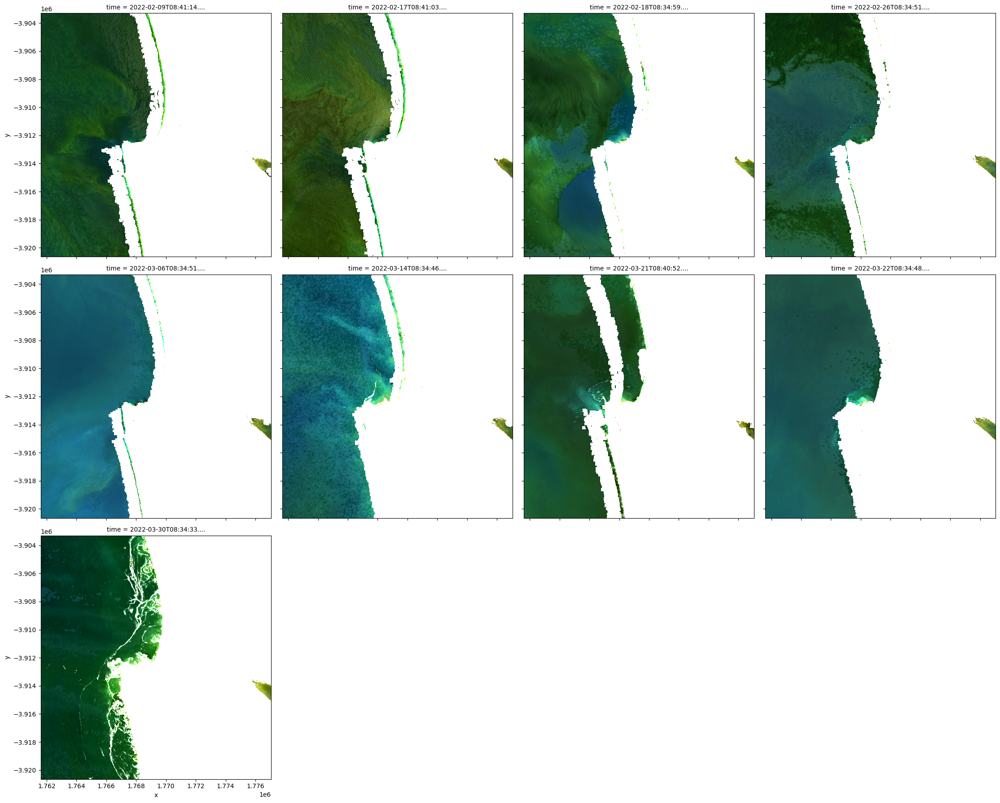

In [6]:
# Calculate MNDWI and add it to the loaded data set
ds = calculate_indices(ds, index=["MNDWI","NDTI"], satellite_mission="ls")
ds = ds.where((ds.MNDWI > 0.0) & (ds.NDTI <= 0.0))
rgb(ds, col='time')

### Algal bloom detection
The algorithm utilizes the CIE (Commission Internationale de l'éclairage) 1931 color space to automatically detect algal blooms in freshwater lakes. Algal blooms typically manifest as greenish colors in freshwater. Higher concentrations of phytoplankton make the water appear greener, which can be identified within the green gamut of the CIE xy chromaticity diagram. Bloom pixels are located closer to the upper border of the green gamut in the chromaticity diagram. In contrast, waters dominated by other constituents (e.g., clear, turbid, or organic matter-rich waters) appear as different colors (e.g., bluish, yellowish, reddish, brownish).

In [7]:
def bloomdetect(ds):
    # Calculate X
    X = ((2.7689 * ds['red']) + (1.7517 * ds['green']) + (1.1302 * ds['blue'])) / \
        (3.7689 * ds['red'] + 6.3989 * ds['green'] + 6.7837 * ds['blue'])

    # Calculate Y
    Y = (1 * ds['red'] + 4.5907 * ds['green'] + 0.0601 * ds['blue']) / \
        (3.7689 * ds['red'] + 6.3989 * ds['green'] + 6.7837 * ds['blue'])
    
    # Calculate Y_diff
    Y_diff = Y - (223.201344 * X**3 - 189.247165 * X**2 + 51.708314 * X - 4.108605)

    # Calculate the Rafai index
    rafai = ds['red'] - 0.5 * ds['green'] - 0.5 * ds['nir']

    # Calculate the difference between the red and green bands
    rg_diff = ds['red'] - ds['green']

    # Create a mask where the reflectance of all three bands is less than 0.5
    rsmask = (ds['green'] < 0.5) & (ds['red'] < 0.5) & (ds['blue'] < 0.5)

    # Define thresholds and mask conditions
    bloom = (Y_diff >= 0) & (rafai < 0) & (rg_diff < 0) & (ds['green'] > 0.02) & (rsmask)

    # Preserve NaN values in the final 'occurrence' array
    bloom = bloom.where(~np.isnan(ds['red']), np.nan)
    
    # Add the 'bloom' array as a new band in the dataset
    ds['occurrence'] = bloom

    return ds

# Apply the bloom detection function to the dataset
ds_bloom = bloomdetect(ds)
ds_bloom

<xarray.Dataset> Size: 96MB
Dimensions:      (time: 9, y: 578, x: 515)
Coordinates:
  * time         (time) datetime64[ns] 72B 2022-02-09T08:41:14.953670 ... 202...
  * y            (y) float64 5kB -3.903e+06 -3.903e+06 ... -3.921e+06 -3.921e+06
  * x            (x) float64 4kB 1.762e+06 1.762e+06 ... 1.777e+06 1.777e+06
    spatial_ref  int32 4B 6933
Data variables:
    red          (time, y, x) float32 11MB dask.array<chunksize=(1, 578, 515), meta=np.ndarray>
    green        (time, y, x) float32 11MB dask.array<chunksize=(1, 578, 515), meta=np.ndarray>
    blue         (time, y, x) float32 11MB dask.array<chunksize=(1, 578, 515), meta=np.ndarray>
    nir          (time, y, x) float32 11MB dask.array<chunksize=(1, 578, 515), meta=np.ndarray>
    swir_1       (time, y, x) float32 11MB dask.array<chunksize=(1, 578, 515), meta=np.ndarray>
    MNDWI        (time, y, x) float32 11MB dask.array<chunksize=(1, 578, 515), meta=np.ndarray>
    NDTI         (time, y, x) float32 11MB dask.array<chunksize=(1, 578, 515), meta=np.ndarray>
    occurrence   (time, y, x) float64 21MB dask.array<chunksize=(1, 578, 515), meta=np.ndarray>
Attributes:
    crs:           EPSG:6933
    grid_mapping:  spatial_ref

### Plot RGB images and bloom occurrence 

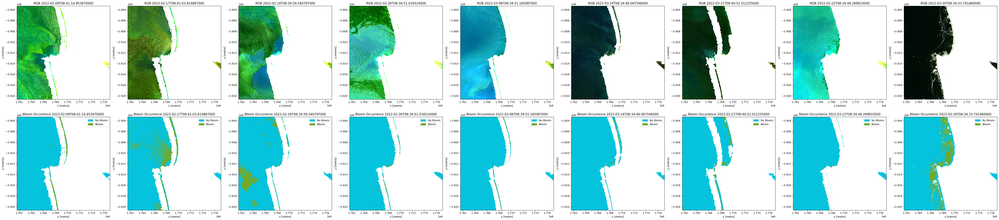

In [8]:
# Custom discrete colormap for binary values (0: no bloom, 1: bloom)
binary_cmap = mcolors.ListedColormap(['#05C3DD', '#71A92C'])  # Light green for no bloom, green for bloom
binary_norm = mcolors.BoundaryNorm(boundaries=[-0.5, 0.5, 1.5], ncolors=2)

# Custom legend patches
legend_labels = ['No Bloom', 'Bloom']
legend_colors = ['#05C3DD', '#71A92C']  # Colors that match the binary_cmap
legend_patches = [mpatches.Patch(color=color, label=label) for color, label in zip(legend_colors, legend_labels)]

# Create a figure with subplots for each time step
n_times = ds_bloom.time.size
fig, axes = plt.subplots(2, n_times, figsize=(n_times * 6, 12))

for i in range(n_times):
    # Plot the bloom occurrence with the binary colormap
    ds_bloom.isel(time=i).occurrence.plot(ax=axes[1, i], cmap=binary_cmap, norm=binary_norm, add_colorbar=False)
    axes[1, i].set_title(f'Bloom Occurrence {ds_bloom.time[i].values}')
    
    # Add the custom discrete legend to every subplot
    axes[1, i].legend(handles=legend_patches, loc='upper right')

    # Plot the RGB image
    rgb(ds_bloom.isel(time=i), ax=axes[0, i])
    axes[0, i].set_title(f'RGB {ds_bloom.time[i].values}')

plt.tight_layout()
plt.show()


### Comparison of algal bloom occurrence with Sentinel-2 chlorophyll index
This code performs an analysis to compare algal bloom occurrences detected through Landsat imagery with chlorophyll concentrations obtained from Sentinel-2 data using the Normalized Difference Chlorophyll Index (NDCI). The NDCI helps to quantify chlorophyll concentrations, which are important for identifying phytoplankton growth and potential algal blooms. A function is implemented to find the closest Sentinel-2 image date within a specified range (10 days) of each Landsat image date. This allows for a direct comparison between the bloom data and chlorophyll concentrations.

A figure is created with subplots for each time step:

* The first row displays RGB images from the Landsat dataset to provide visual context.
* The second row visualizes the binary occurrence of algal blooms, using a custom color map to distinguish between 'No Bloom' and 'Bloom'.
* The third row shows the NDCI values from the corresponding Sentinel-2 data, indicating chlorophyll concentrations.

Using pixel quality parameters for Sentinel 2
Finding datasets
    s2_l2a
Counting good quality pixels for each time step
Filtering to 12 out of 24 time steps with at least 99.0% good quality pixels
Applying pixel quality/cloud mask
Returning 12 time steps as a dask array


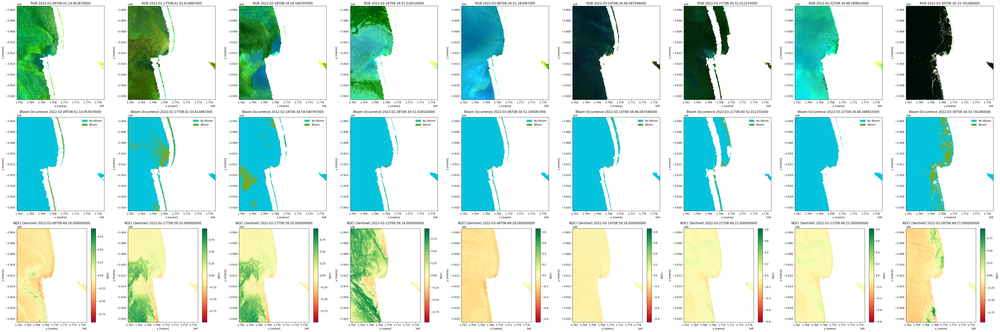

In [9]:
# Create a reusable query
query = {
    "x": lon_range,
    "y": lat_range,
    "time": time,
    "resolution": (-10, 10),
    "measurements": ['red', 'green', 'blue', 'nir', 'swir_1','red_edge_1']
}
ds_s2 = load_ard(dc=dc, 
              products=["s2_l2a"],
              min_gooddata=0.99,
              output_crs=output_crs,
              group_by="solar_day",
              dask_chunks={'time':1, 'x':2000, 'y':2000},
              **query)
ds_s2 = calculate_indices(ds_s2, index=["MNDWI","NDCI"], satellite_mission="ls")
ds_s2 = ds_s2.where(ds_s2.MNDWI > 0)


# Function to find the closest Sentinel 2 date within 10 days
def find_closest_sentinel_date(landsat_date, sentinel_dates, max_days=5):
    time_diff = np.abs(sentinel_dates - landsat_date)
    closest_date_index = time_diff.argmin()
    if time_diff[closest_date_index] <= np.timedelta64(max_days, 'D'):
        return closest_date_index
    else:
        return None

# Custom discrete colormap for binary values (0: no bloom, 1: bloom)
binary_cmap = mcolors.ListedColormap(['#05C3DD', '#71A92C'])  # Light green for 0, blue for 1

# Custom discrete norm to map 0 and 1
binary_norm = mcolors.BoundaryNorm(boundaries=[-0.5, 0.5, 1.5], ncolors=2)

# Custom legend patches
legend_labels = ['No Bloom', 'Bloom']
legend_colors = ['#05C3DD', '#71A92C']   # Same as in binary_cmap
legend_patches = [mpatches.Patch(color=color, label=label) for color, label in zip(legend_colors, legend_labels)]

# Create a figure with subplots for each time step
n_times = ds_bloom.time.size
fig, axes = plt.subplots(3, n_times, figsize=(n_times * 6, 18))

for i in range(n_times):
    # Plot the RGB image
    rgb(ds_bloom.isel(time=i), ax=axes[0, i])
    axes[0, i].set_title(f'RGB {ds_bloom.time[i].values}')
    
    # Plot the bloom occurrence without the color bar
    ds_bloom.isel(time=i).occurrence.plot(ax=axes[1, i], cmap=binary_cmap, norm=binary_norm, add_colorbar=False)
    axes[1, i].set_title(f'Bloom Occurrence {ds_bloom.time[i].values}')
    
    # Add the custom discrete legend to every middle subplot
    axes[1, i].legend(handles=legend_patches, loc='upper right')

    # Find the closest Sentinel 2 date within 5 days
    landsat_date = ds_bloom.time[i].values
    closest_sentinel_idx = find_closest_sentinel_date(landsat_date, ds_s2.time.values)

    # Plot the NDCI without the color bar if a corresponding date is found, otherwise leave blank
    if closest_sentinel_idx is not None:
        ds_s2.isel(time=closest_sentinel_idx).NDCI.plot(ax=axes[2, i], cmap='RdYlGn')
        axes[2, i].set_title(f'NDCI (Sentinel) {ds_s2.time[closest_sentinel_idx].values}')
    else:
        axes[2, i].set_title(f'No Sentinel-2 image within 5 days')

# Adjust layout
plt.tight_layout()
plt.show()


---

## Additional information

**License:** The code in this notebook is licensed under the [Apache License, Version 2.0](https://www.apache.org/licenses/LICENSE-2.0). 
Digital Earth Africa data is licensed under the [Creative Commons by Attribution 4.0](https://creativecommons.org/licenses/by/4.0/) license.

**Contact:** If you need assistance, please post a question on the [Open Data Cube Slack channel](http://slack.opendatacube.org/) or on the [GIS Stack Exchange](https://gis.stackexchange.com/questions/ask?tags=open-data-cube) using the `open-data-cube` tag (you can view previously asked questions [here](https://gis.stackexchange.com/questions/tagged/open-data-cube)).
If you would like to report an issue with this notebook, you can file one on [Github](https://github.com/digitalearthafrica/deafrica-sandbox-notebooks).

**Compatible datacube version:**

In [10]:
print(datacube.__version__)

1.8.19


In [11]:
from datetime import datetime
datetime.today().strftime('%Y-%m-%d')

'2024-11-01'